In [28]:
!pip install diffusers
!pip install sentence-transformers
!pip install torch
!pip install pot

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [29]:
!pip install opencv-python


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [30]:
!pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [31]:
!pip install accelerate

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [32]:
!pip install tf-keras

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [33]:
!pip install gensim

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [34]:
!pip install ipywidgets --upgrade

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [35]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://download.pytorch.org/whl/cu118



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [36]:
import torch
print(torch.cuda.is_available())  
print(torch.version.cuda)  

True
11.8


In [37]:
from diffusers import DiffusionPipeline, StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
import torch
from PIL import Image
import requests
from io import BytesIO

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from sentence_transformers import SentenceTransformer

import os

from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
from PIL import Image
from IPython.display import display, Image as Image2
import sys
from transformers import AutoImageProcessor, AutoModel
from PIL import Image
import requests
import cv2
from sklearn.decomposition import TruncatedSVD

from sklearn.linear_model import LinearRegression
from scipy.spatial.distance import cosine
import matplotlib.pyplot as plt
from matplotlib import transforms
import torch
import os
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import Ridge
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from itertools import chain, combinations
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import wasserstein_distance
from gensim.models import KeyedVectors
from gensim.downloader import load as api_load
from gensim.models import KeyedVectors
from sklearn.metrics.pairwise import euclidean_distances
from scipy.spatial.distance import cdist
from transformers import AutoTokenizer, AutoModel
import torch
import tensorflow as tf
from gensim.models import KeyedVectors
from torch import Generator
import warnings
warnings.filterwarnings('ignore')


In [38]:
import torch
torch.cuda.empty_cache()

In [39]:
#Instruct PIX2PIX
# Initialize the model and pipeline
model_name = "timbrooks/instruct-pix2pix"
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_name, torch_dtype=torch.float16, force_download=True)
device = "cuda"
pipe.to(device)

model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionInstructPix2PixPipeline {
  "_class_name": "StableDiffusionInstructPix2PixPipeline",
  "_diffusers_version": "0.31.0",
  "_name_or_path": "timbrooks/instruct-pix2pix",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "EulerAncestralDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [40]:
#Dinov2
processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base")
model = AutoModel.from_pretrained("facebook/dinov2-base")
#Word2Vec model
model_path_bin = r'D:\test2\test2\GoogleNews-vectors-negative300.bin'
model_txt = KeyedVectors.load_word2vec_format(model_path_bin, binary=True)


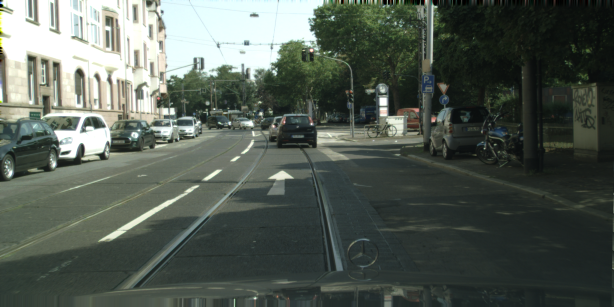

In [41]:
# Load the initial image
url = r"D:\resize30%\1(1).png"
init_image = Image.open(url)
display(init_image)


In [42]:
cfg_image = 7.5 # This controls how much the output should resemble the original image
cfg_text = 1.5 # This controls how much the output should follow the text prompt

In [43]:
prompt = "add rain drop to this image ###"
words = prompt.split()
words

['add', 'rain', 'drop', 'to', 'this', 'image', '###']

In [44]:
def extract_image_embedding(image, processor, model):
    """Extract embeddings from an image using the DINOv2 model."""
    inputs = processor(images=image, return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
    embeddings = outputs.last_hidden_state.mean(dim=1).squeeze().cpu().numpy()
    return embeddings

# Set initial Wasserstein distance to a large number
WD_dist_init = float('inf')

# Path to save generated images on your local system
output_path = "D:\\test2\\60test_str_snow\\orig.png"


# Repeat generation process until Wasserstein distance is less than 0.1
while WD_dist_init > 0.07:
    # Generate the image
    orig_image = pipe(
        prompt=prompt, 
        image=init_image, 
        cfg_image=cfg_image, 
        cfg_text=cfg_text).images[0]
    
    # Extract embeddings for the original image and initial image
    orig_embedding = extract_image_embedding(orig_image, processor, model)
    init_embedding = extract_image_embedding(init_image, processor, model)
    
    # Calculate Wasserstein distance between the embeddings
    WD_dist_init = wasserstein_distance(orig_embedding, init_embedding)

    print(f'Wasserstein distance: {WD_dist_init}')

    # Save and display the image only if the distance is acceptable
    if WD_dist_init <= 0.07:
        # Save the generated image to the local path
        orig_image.save(output_path)
        print(f"Image saved at: {output_path}")
        
        # Display the image if you're working in an environment where you can visualize it
        # You might need to remove this in VSCode, or use an external viewer
        orig_image.show()

print("Image generation complete with acceptable Wasserstein distance!")


  0%|          | 0/100 [00:00<?, ?it/s]

Wasserstein distance: 0.026662293530989714
Image saved at: D:\test2\60test_str_snow\orig.png
Image generation complete with acceptable Wasserstein distance!


In [45]:
# Setting up seeds for reproducibility
seed = 1024
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)  # If using GPU
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
generator = torch.Generator().manual_seed(seed)

def perturb_text(text_list, perturbation, rng):
    # Select words based on the perturbation flag (1 means include), ensuring no duplicate words within a single sentence
    perturbed_list_initial = [item for item, flag in zip(text_list, perturbation) if flag == 1 and item.strip() != ""]
    
    # If no words were selected, force-select at least two words
    if len(perturbed_list_initial) < 2:
        additional_words_needed = 2
        available_words = [item for item in text_list if item.strip() != ""]
        additional_words = rng.choice(available_words, additional_words_needed, replace=False)
        perturbed_list = list(set(perturbed_list_initial + list(additional_words)))  # Ensure unique words
    else:
        perturbed_list = list(set(perturbed_list_initial))  # Remove duplicates within the sentence
    
    return perturbed_list

# Assuming `prompt` is predefined
words = prompt.split()
text_list = words.copy()

num_perturb = 30  # Number of perturbations to generate
num_words = len(words)

Responses = []
Perturbations = []
unique_perturbations = set()
rng = np.random.default_rng(seed)

# Try up to a certain number of attempts to generate unique perturbations
attempts = 0
max_attempts = num_perturb * 10  # Allow 10 attempts per unique perturbation

# Loop for unique perturbations only
while len(unique_perturbations) < num_perturb and attempts < max_attempts:
    perturbation = tuple(rng.binomial(1, 0.5, size=num_words))
    if perturbation not in unique_perturbations and sum(perturbation) > 0:
        unique_perturbations.add(perturbation)
        perturbed_txt = perturb_text(text_list, perturbation, rng)
        corpus = ' '.join(perturbed_txt)
        Responses.append(corpus)
        Perturbations.append(perturbation)
        print(f"Perturbation: {perturbation}, Perturbed Text: {corpus}")  # Print unique perturbation text
    attempts += 1

# If more perturbations are needed, allow repeats by sampling from unique_perturbations
while len(Responses) < num_perturb:
    perturbation = rng.choice(list(unique_perturbations))
    perturbed_txt = perturb_text(text_list, perturbation, rng)
    corpus = ' '.join(perturbed_txt)
    Responses.append(corpus)
    Perturbations.append(perturbation)
    print(f"Perturbation (reused): {perturbation}, Perturbed Text: {corpus}")  # Print reused perturbation text


Perturbation: (0, 0, 0, 1, 1, 0, 1), Perturbed Text: ### this to
Perturbation: (1, 1, 0, 1, 0, 1, 0), Perturbed Text: image add to rain
Perturbation: (1, 0, 1, 1, 1, 0, 1), Perturbed Text: to drop this ### add
Perturbation: (0, 1, 1, 0, 1, 1, 1), Perturbed Text: drop rain this image ###
Perturbation: (0, 0, 1, 0, 0, 0, 0), Perturbed Text: image drop
Perturbation: (1, 1, 1, 1, 1, 0, 0), Perturbed Text: to drop rain this add
Perturbation: (1, 0, 0, 0, 1, 0, 1), Perturbed Text: ### this add
Perturbation: (0, 0, 0, 1, 1, 1, 0), Perturbed Text: this image to
Perturbation: (0, 1, 1, 1, 1, 0, 1), Perturbed Text: to drop rain this ###
Perturbation: (1, 1, 0, 0, 0, 1, 1), Perturbed Text: ### image add rain
Perturbation: (0, 1, 0, 0, 0, 1, 1), Perturbed Text: ### image rain
Perturbation: (0, 0, 0, 0, 0, 0, 1), Perturbed Text: ### this drop
Perturbation: (1, 0, 0, 0, 0, 1, 1), Perturbed Text: ### image add
Perturbation: (0, 0, 1, 0, 0, 1, 0), Perturbed Text: image drop
Perturbation: (1, 1, 1, 1, 

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 1:
Wasserstein distance (generated vs init): 0.025750593572041694
Wasserstein distance (generated vs orig): 0.007717374328279901


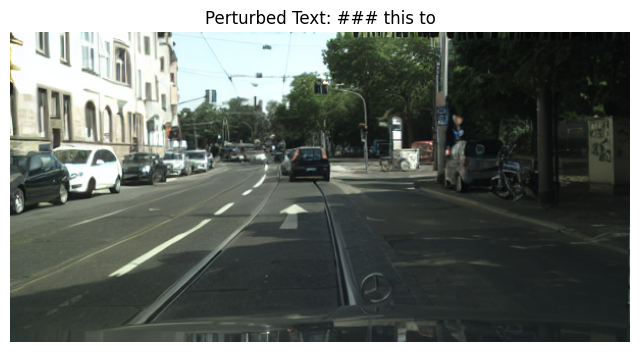

Image generation 1 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 2:
Wasserstein distance (generated vs init): 0.028831853755188295
Wasserstein distance (generated vs orig): 0.01726983595873815


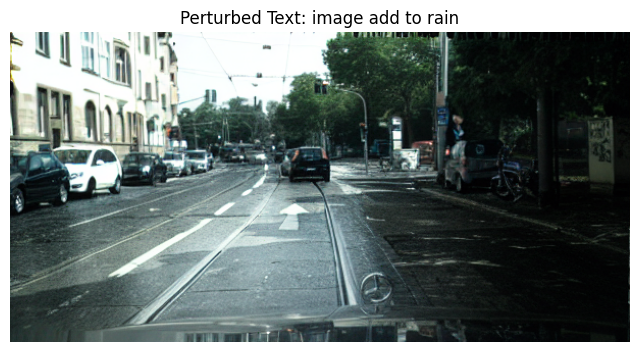

Image generation 2 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 3:
Wasserstein distance (generated vs init): 0.027743578386738
Wasserstein distance (generated vs orig): 0.007570895234114994


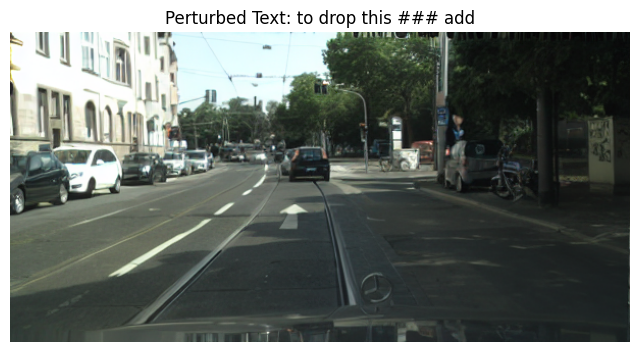

Image generation 3 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 4:
Wasserstein distance (generated vs init): 0.02873205657389615
Wasserstein distance (generated vs orig): 0.0179694827346945


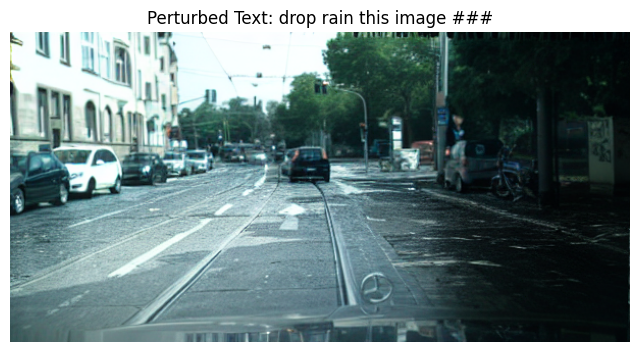

Image generation 4 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 5:
Wasserstein distance (generated vs init): 0.029599730494894082
Wasserstein distance (generated vs orig): 0.014831459798031705


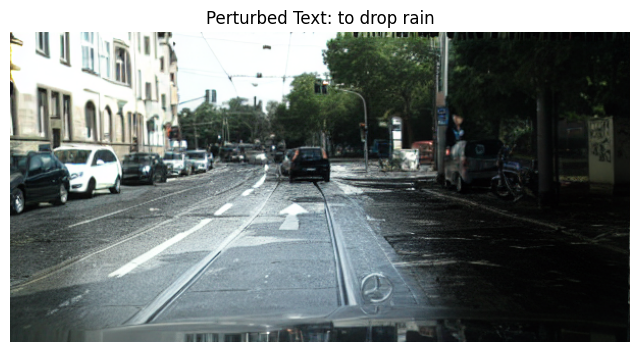

Image generation 5 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 6:
Wasserstein distance (generated vs init): 0.036910833992502966
Wasserstein distance (generated vs orig): 0.026349230407712792


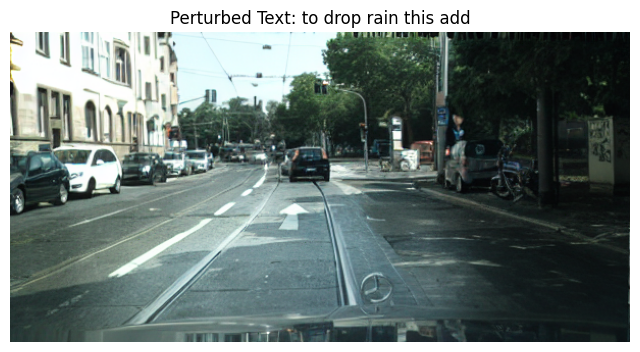

Image generation 6 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 7:
Wasserstein distance (generated vs init): 0.026964840394308968
Wasserstein distance (generated vs orig): 0.008077899700159217


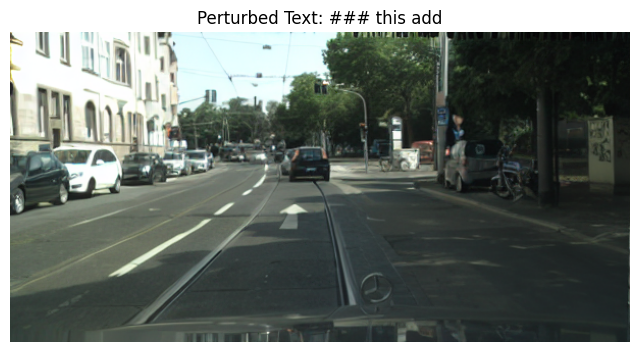

Image generation 7 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 8:
Wasserstein distance (generated vs init): 0.025966866642927296
Wasserstein distance (generated vs orig): 0.008321686296109004


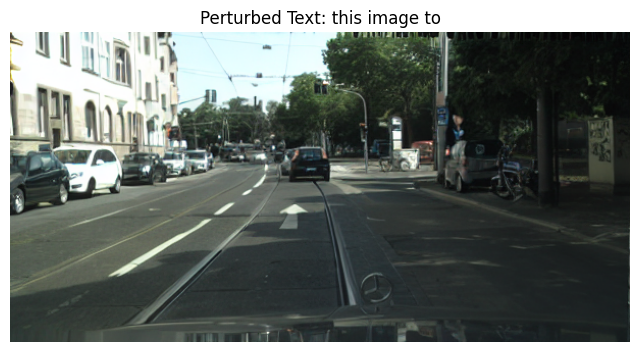

Image generation 8 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 9:
Wasserstein distance (generated vs init): 0.027764410996193558
Wasserstein distance (generated vs orig): 0.015284976849936061


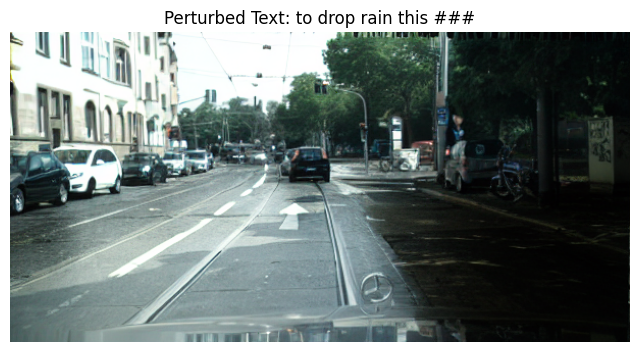

Image generation 9 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 10:
Wasserstein distance (generated vs init): 0.02483373856678856
Wasserstein distance (generated vs orig): 0.01907620703764224


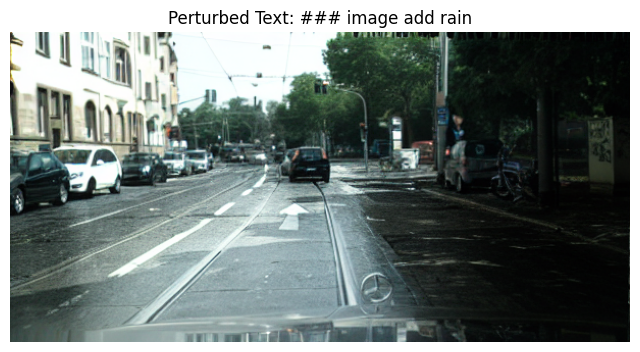

Image generation 10 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 11:
Wasserstein distance (generated vs init): 0.029228915584705348
Wasserstein distance (generated vs orig): 0.022200950608142506


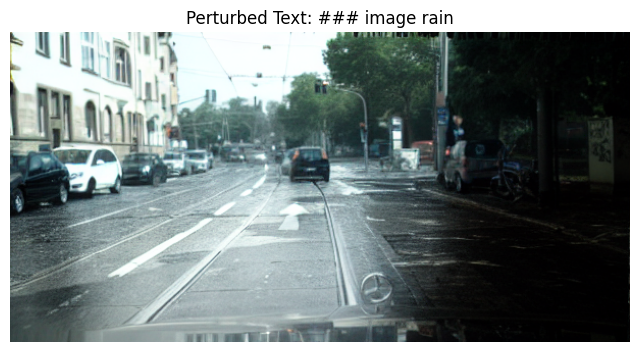

Image generation 11 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 12:
Wasserstein distance (generated vs init): 0.026961417832202027
Wasserstein distance (generated vs orig): 0.0267660220047219


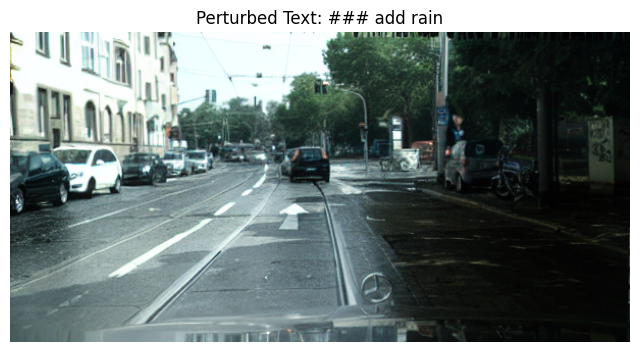

Image generation 12 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 13:
Wasserstein distance (generated vs init): 0.026618658036871547
Wasserstein distance (generated vs orig): 0.009150791878748048


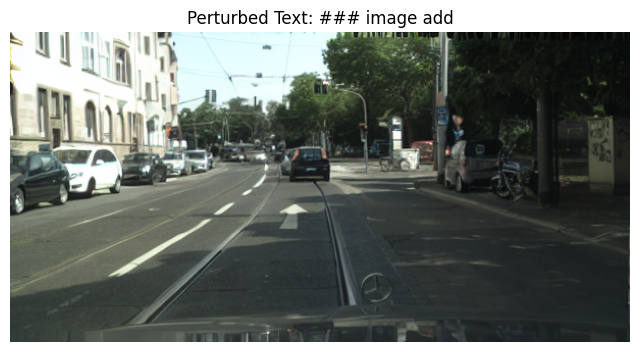

Image generation 13 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 14:
Wasserstein distance (generated vs init): 0.025746914826716746
Wasserstein distance (generated vs orig): 0.0086274526993293


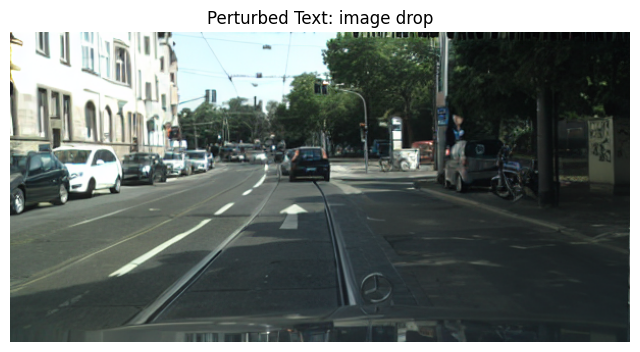

Image generation 14 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 15:
Wasserstein distance (generated vs init): 0.025285481290666215
Wasserstein distance (generated vs orig): 0.028427551367106705


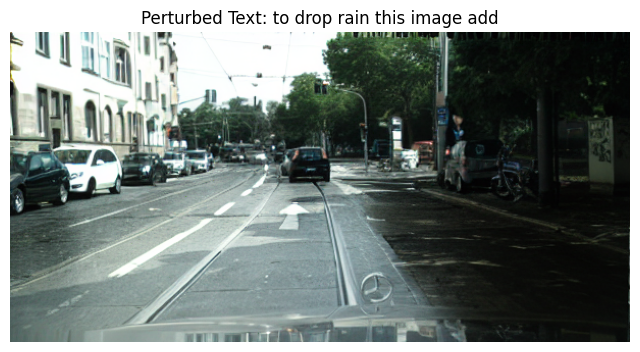

Image generation 15 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 16:
Wasserstein distance (generated vs init): 0.02567666011964318
Wasserstein distance (generated vs orig): 0.014905407733446435


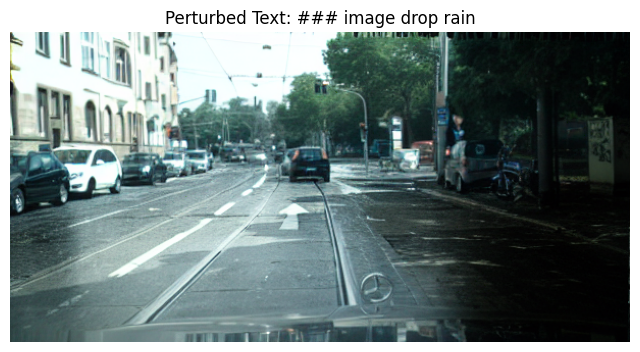

Image generation 16 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 17:
Wasserstein distance (generated vs init): 0.023528538407845204
Wasserstein distance (generated vs orig): 0.024601199575954524


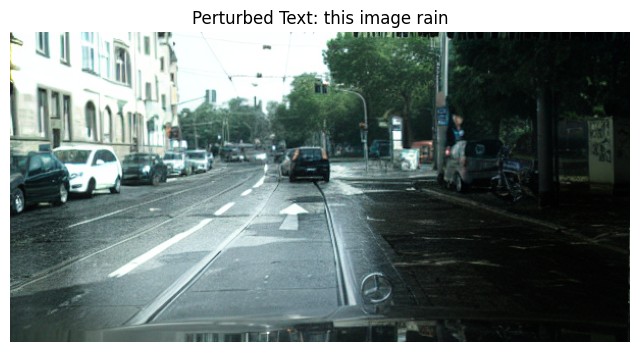

Image generation 17 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 18:
Wasserstein distance (generated vs init): 0.02555072567338359
Wasserstein distance (generated vs orig): 0.008862941051726619


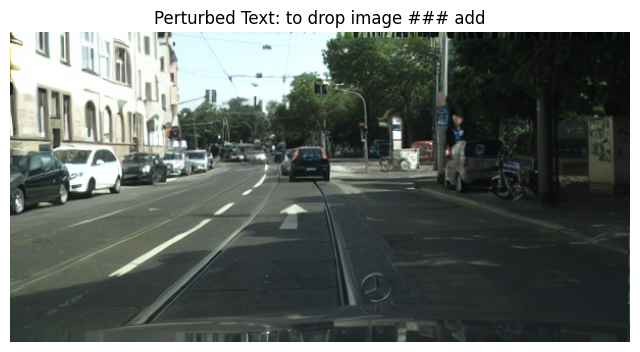

Image generation 18 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 19:
Wasserstein distance (generated vs init): 0.030057249180667142
Wasserstein distance (generated vs orig): 0.020034945123882143


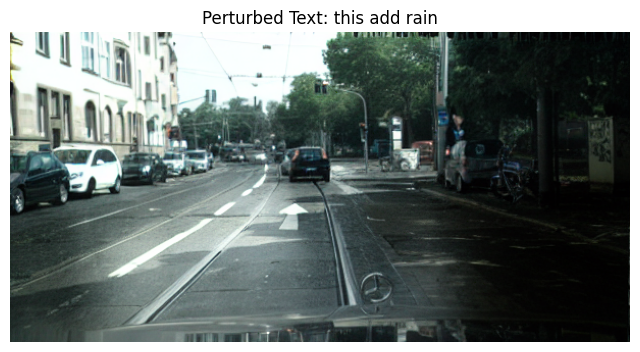

Image generation 19 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 20:
Wasserstein distance (generated vs init): 0.02797219015974408
Wasserstein distance (generated vs orig): 0.009283558018751144


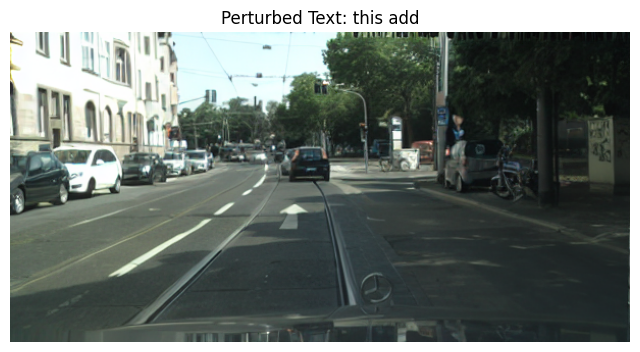

Image generation 20 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 21:
Wasserstein distance (generated vs init): 0.025711345924702776
Wasserstein distance (generated vs orig): 0.021283288394123197


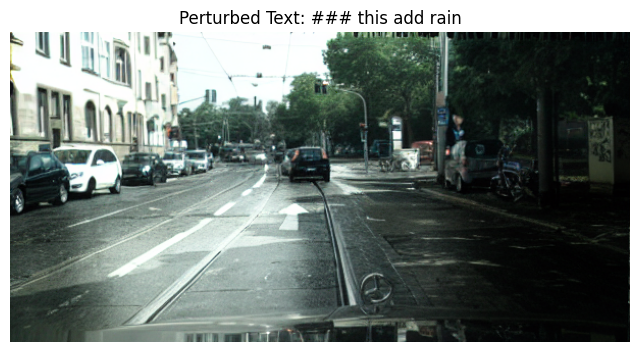

Image generation 21 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 22:
Wasserstein distance (generated vs init): 0.027542239055568046
Wasserstein distance (generated vs orig): 0.007886911953619352


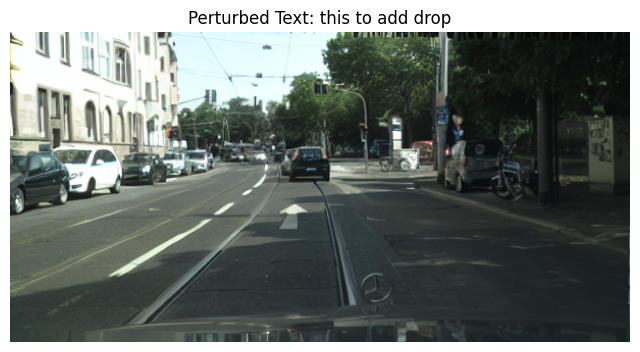

Image generation 22 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 23:
Wasserstein distance (generated vs init): 0.024797064154730215
Wasserstein distance (generated vs orig): 0.02069536426385338


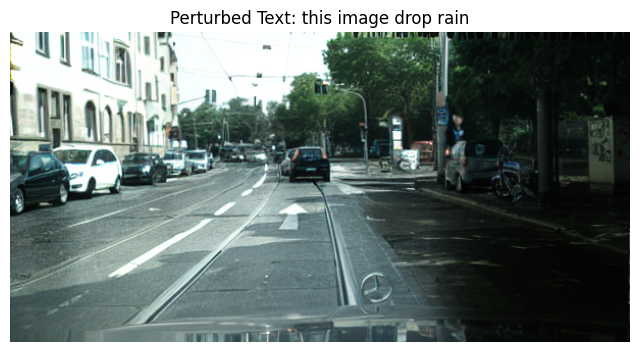

Image generation 23 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 24:
Wasserstein distance (generated vs init): 0.028223372696317042
Wasserstein distance (generated vs orig): 0.007772397759244615


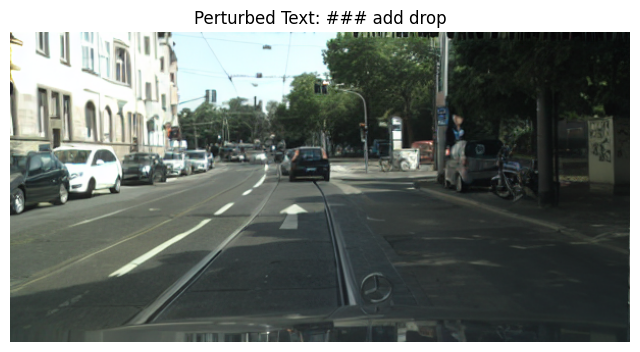

Image generation 24 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 25:
Wasserstein distance (generated vs init): 0.02945383501476804
Wasserstein distance (generated vs orig): 0.007771888573188328


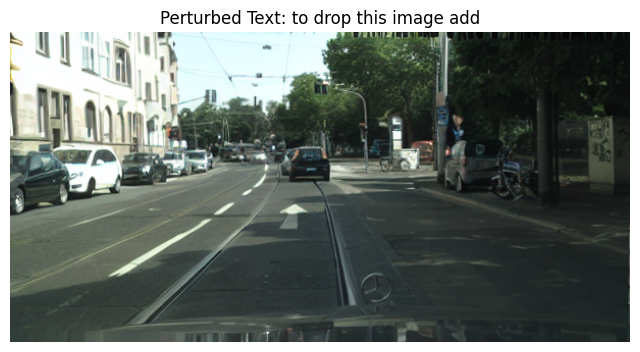

Image generation 25 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 26:
Wasserstein distance (generated vs init): 0.025464613678650497
Wasserstein distance (generated vs orig): 0.0073087732322202675


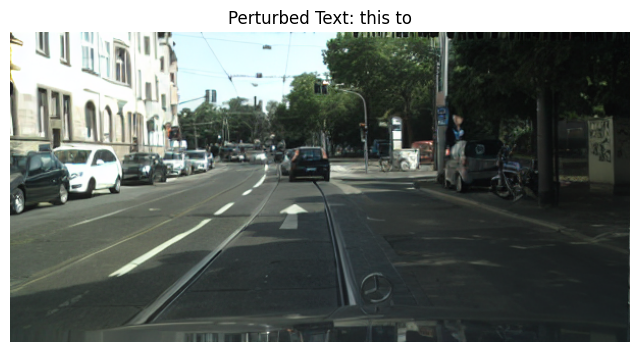

Image generation 26 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 27:
Wasserstein distance (generated vs init): 0.02814821962978917
Wasserstein distance (generated vs orig): 0.01613819595830063


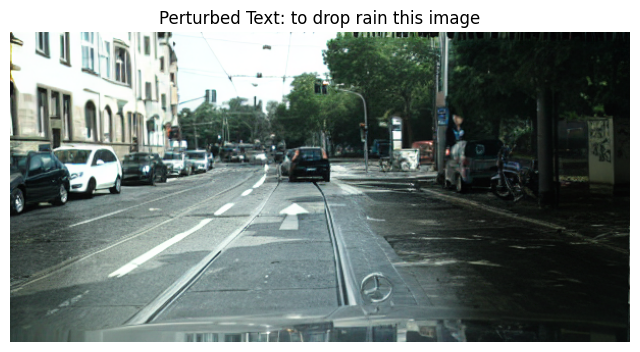

Image generation 27 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 28:
Wasserstein distance (generated vs init): 0.026867370001051914
Wasserstein distance (generated vs orig): 0.02002245377002508


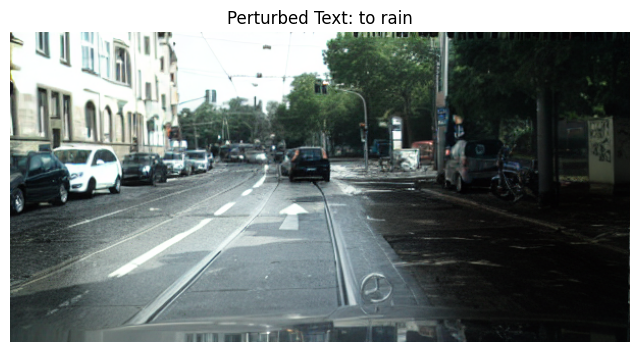

Image generation 28 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 29:
Wasserstein distance (generated vs init): 0.022156992434853834
Wasserstein distance (generated vs orig): 0.015926311725365835


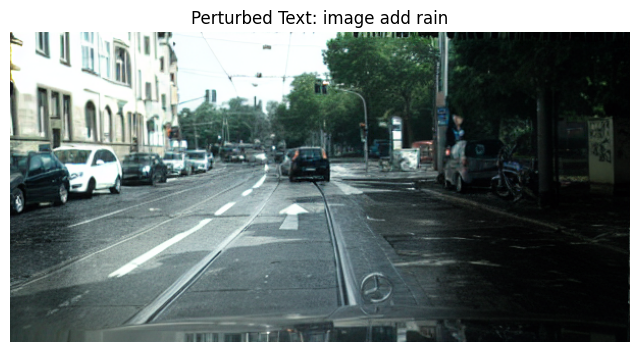

Image generation 29 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 30:
Wasserstein distance (generated vs init): 0.02680592604898873
Wasserstein distance (generated vs orig): 0.007593769412020875


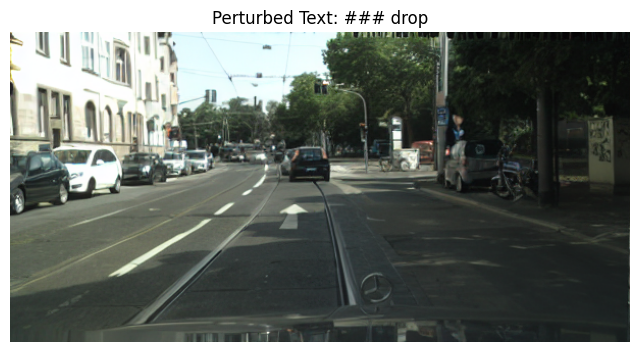

Image generation 30 complete with acceptable Wasserstein distance!


In [46]:
epsilon = 1e-6  # A small value to prevent division by zero
WD_dists_generated_vs_orig = []  # List to store Wasserstein distances

for i, perturbation in enumerate(Perturbations):
    # Generate new text for each perturbation
    perturbed_txt = perturb_text(text_list, perturbation, rng)
    corpus = ' '.join(perturbed_txt)
    
    # Set initial Wasserstein distances for generated image
    WD_dist_generated = float('inf')
    WD_dist_generated_vs_orig_value = float('inf')  # Distance between generated_image and orig_image (temporarily stored inside the loop)

    # Repeat generation process
    while WD_dist_generated > 0.07:  
        # Generate the original image (once, if not already generated)
        orig_image = pipe(
            prompt=corpus,  # Use the perturbed text
            image=init_image, 
            cfg_image=cfg_image, 
            cfg_text=cfg_text).images[0]

        # Generate another image (generated image)
        generated_image = pipe(
            prompt=corpus,  # Use the perturbed text
            image=init_image, 
            cfg_image=cfg_image, 
            cfg_text=cfg_text).images[0]

        # Extract embeddings for the generated image, original image, and initial image
        generated_embedding = extract_image_embedding(generated_image, processor, model)
        init_embedding = extract_image_embedding(init_image, processor, model)
        orig_embedding = extract_image_embedding(orig_image, processor, model)

        # Calculate Wasserstein distance between generated image and initial image
        WD_dist_generated = wasserstein_distance(generated_embedding, init_embedding)

        # If the distance is greater than 0.1, the image is regenerated and no further calculations are done
        if WD_dist_generated > 0.07:
            print(f"Distance too large (WD_dist_generated = {WD_dist_generated}), regenerating image...")
            continue  # Go back to the beginning of the loop to regenerate the image

        # Calculate Wasserstein distance between generated image and original image
        WD_dist_generated_vs_orig_value = wasserstein_distance(generated_embedding, orig_embedding)

        # Store the Wasserstein distance between the generated image and the original image
        WD_dists_generated_vs_orig.append(WD_dist_generated_vs_orig_value)

        # Display the Wasserstein distances
        print(f"Perturbation {i + 1}:")
        print(f'Wasserstein distance (generated vs init): {WD_dist_generated}')
        print(f'Wasserstein distance (generated vs orig): {WD_dist_generated_vs_orig_value}')

        # Display the image only if the distance is acceptable
        plt.figure(figsize=(8, 8))
        plt.imshow(generated_image)
        plt.title(f"Perturbed Text: {corpus}", fontsize=12)
        plt.axis('off')  # Remove the axes
        plt.show()

        # Save the image to the output path if the distance is acceptable
        print(f"Image generation {i + 1} complete with acceptable Wasserstein distance!")
        break  # Exit the loop if the image is acceptable


In [47]:
wmd_scores = {}
all_texts = [prompt] + Responses  # Include the original text (prompt) and all responses (perturbed texts)

for idx, text in enumerate(Responses):  # Loop through all perturbed texts (Responses)
    wmd_score = model_txt.wmdistance(prompt, text)  # Compute WMD between prompt and perturbed text
    wmd_scores[f"Original vs Perturbed {idx+1}"] = wmd_score

# Display the WMD scores
print("WMD Scores:\n")
for key, value in wmd_scores.items():
    print(f"{key}: {value:.4f}")

# Assigning WMD scores to a variable 'distances' for future use
distances = wmd_scores


WMD Scores:

Original vs Perturbed 1: 0.5174
Original vs Perturbed 2: 0.3036
Original vs Perturbed 3: 0.2921
Original vs Perturbed 4: 0.1546
Original vs Perturbed 5: 0.4188
Original vs Perturbed 6: 0.3022
Original vs Perturbed 7: 0.4794
Original vs Perturbed 8: 0.4965
Original vs Perturbed 9: 0.2336
Original vs Perturbed 10: 0.3442
Original vs Perturbed 11: 0.4797
Original vs Perturbed 12: 0.3036
Original vs Perturbed 13: 0.5191
Original vs Perturbed 14: 0.4188
Original vs Perturbed 15: 0.1660
Original vs Perturbed 16: 0.2799
Original vs Perturbed 17: 0.4473
Original vs Perturbed 18: 0.2660
Original vs Perturbed 19: 0.4264
Original vs Perturbed 20: 0.5682
Original vs Perturbed 21: 0.3131
Original vs Perturbed 22: 0.3998
Original vs Perturbed 23: 0.2797
Original vs Perturbed 24: 0.5496
Original vs Perturbed 25: 0.2485
Original vs Perturbed 26: 0.6188
Original vs Perturbed 27: 0.2442
Original vs Perturbed 28: 0.5849
Original vs Perturbed 29: 0.4750
Original vs Perturbed 30: 0.5701


In [48]:
Perturbations = np.vstack(Perturbations)
distance_values = np.array(list(distances.values()))


In [49]:
WD_dists_generated_vs_orig = np.array(WD_dists_generated_vs_orig)

# Step 1: Compute the inverse of the distances (add a small value to avoid division by zero)
epsilon = 1e-8  # Small value to prevent division by zero
inverse_distances = 1 / (WD_dists_generated_vs_orig + epsilon)

# Step 2: Scale the inverse distances between 0 and 1 (Min-Max scaling)
min_inv = np.min(WD_dists_generated_vs_orig)
max_inv = np.max(WD_dists_generated_vs_orig)

Similarities = (WD_dists_generated_vs_orig - min_inv) / (max_inv - min_inv)

# Now Similarities contains the scaled similarities between 0 and 1
print(Similarities)


[0.01934776 0.47166852 0.0124118  0.50479765 0.35620842 0.90158896
 0.03641908 0.04796267 0.37768301 0.5572024  0.70516283 0.92132455
 0.08722184 0.06244109 1.         0.35970994 0.81881756 0.07359175
 0.60259982 0.09350848 0.6617104  0.02737558 0.63387147 0.02195319
 0.02192908 0.         0.41808398 0.60200834 0.408051   0.01349492]


In [50]:
distance_values = np.array(list(distances.values()))

kernel_width = 0.25

# Compute weights based on the distances
weights = np.sqrt(np.exp(-(distance_values ** 2) / (kernel_width ** 2)))

# Fit a Linear Regression model
linear_model = LinearRegression()

linear_model.fit(X=Perturbations, y= Similarities, sample_weight=weights)

# Retrieve coefficients from the model
coefficients = linear_model.coef_

# Print the coefficients and weights
print("Coefficients from the Linear Regression model:", coefficients)
print("\nComputed Weights:", weights)


Coefficients from the Linear Regression model: [ 0.0309534   0.45201156 -0.03880283 -0.07903324 -0.0591931  -0.14034963
 -0.12751757]

Computed Weights: [0.11743839 0.47844642 0.50529529 0.82596628 0.24586618 0.48151221
 0.15906484 0.13913426 0.64634647 0.38758593 0.15863788 0.47844642
 0.11584075 0.24586618 0.80224315 0.53427359 0.20173951 0.56780126
 0.23348634 0.07555872 0.45654661 0.27843704 0.53489664 0.08923753
 0.61016269 0.04673352 0.62048592 0.06477202 0.16451172 0.07425215]


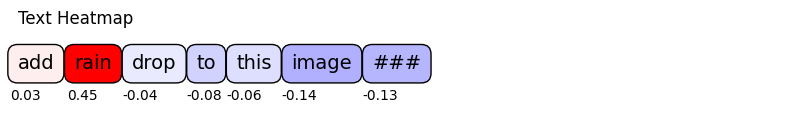

In [51]:
def plot_text_heatmap(words, scores, title="", width=10, height=0.4, verbose=0, max_word_per_line=20, word_spacing=20, score_fontsize=10, save_path=None):
    fig = plt.figure(figsize=(width, height))
    ax = plt.gca()
    ax.set_title(title, loc='left')
    cmap = plt.cm.ScalarMappable(cmap=plt.cm.bwr)
    cmap.set_clim(0, 1)
    canvas = ax.figure.canvas
    t = ax.transData
    normalized_scores = 0.5 * scores / np.max(np.abs(scores)) + 0.5
    loc_y = -0.2
    for i, (token, score) in enumerate(zip(words, scores)):
        *rgb, _ = cmap.to_rgba(normalized_scores[i], bytes=True)
        color = '#%02x%02x%02x' % tuple(rgb)
        
        text = ax.text(0.0, loc_y, token, bbox={'facecolor': color, 'pad': 5.0, 'linewidth': 1, 'boxstyle': 'round,pad=0.5'}, transform=t, fontsize=14)
        text.draw(canvas.get_renderer())
        ex = text.get_window_extent()
        score_text = ax.text(0.01, loc_y - 1, f"{score:.2f}", transform=t, fontsize=score_fontsize, ha='center')
        score_text.draw(canvas.get_renderer())
        ex_score = score_text.get_window_extent()
        if (i+1) % max_word_per_line == 0:
            loc_y = loc_y - 2.5
            t = ax.transData
        else:
            t = transforms.offset_copy(text._transform, x=ex.width + word_spacing, units='dots')
    if verbose == 0:
        ax.axis('off')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()
    words = prompt.split(' ')
# Define the save path for Kaggle output
save_path = save_path = 'D:\\test2\\60test_str_snow\\heatmap.png'


# Call the function with the save_path
plot_text_heatmap(words, coefficients, title="Text Heatmap", save_path=save_path)